In [1]:
import sys
sys.path.append("../utils")
from utils import *
from omegaconf import OmegaConf

In [2]:
conf = OmegaConf.create(
    {   
        # General data args
        "data_dirs": {
            "kumar": {
                "train_im":"../../../../datasets/nucleisegmentation_kumar/train/Images",
                "train_gt":"../../../../datasets/nucleisegmentation_kumar/train/Labels",
                "test_im":"../../../../datasets/nucleisegmentation_kumar/test/Images",
                "test_gt":"../../../../datasets/nucleisegmentation_kumar/test/Labels",
            },
            "consep":{
                "train_im":"../../../../datasets/nucleisegmentation_consep/train/Images",
                "train_gt":"../../../../datasets/nucleisegmentation_consep/train/Labels",
                "test_im":"../../../../datasets/nucleisegmentation_consep/test/Images",
                "test_gt":"../../../../datasets/nucleisegmentation_consep/test/Labels",
            },
            "pannuke": {
                "train_im":"../../../../datasets/nucleisegmentation_pannuke/train/Images",
                "train_gt":"../../../../datasets/nucleisegmentation_pannuke/train/Labels",
                "valid_im":"../../../../datasets/nucleisegmentation_pannuke/valid/Images",
                "valid_gt":"../../../../datasets/nucleisegmentation_pannuke/valid/Labels",
                "test_im":"../../../../datasets/nucleisegmentation_pannuke/test/Images",
                "test_gt":"../../../../datasets/nucleisegmentation_pannuke/test/Labels",
            },
            "other": {
                # TODO:
                "train_im":"../../../../datasets/other/...",
                "train_gt":"../../../../datasets/other/...",
                "test_im":"../../../../datasets/other/...",
                "train_gt":"../../../../datasets/other/...",
            }
        },
        "dataset":"kumar", # What dataset you want to use?
        "binary_classes": {
            "background":0,
            "nuclei":1
        },
        "consep_classes":{
            'background':0,
            # TODO: rest off the classes
        },
        "consep_classes":{
            'background':0,
            # TODO: rest off the classes
        },
        
        # HDF5 Database args
        "database_root_dir":"../../../../databases",
        "patch_size":256, # Size of an image patch that gets written to hdf5 db
        "phases":["train", "valid", "test"], # or ["train", "test"]
        
        # Model training args
        "experiment_root_dir":"../../../../results/tests/",
        "model_name":"FPN",
        "experiment_version":"test5",
        "batch_size":6,
        "resume_training":True, # continue training where you left off?
        "num_epochs":7,
        "num_gpus":1,
        
        "optimizer_args":{
            "lr":0.001,
            "encoder_lr":0.0005,
            "weight_decay":0.0003,
            "encoder_weight_decay":0.00003
        },
        
        "scheduler_args": {
            "factor":0.25,
            "patience":2
        },
    
        "loss_args" : {
            "edge_weight" : 1.1,
        },
        
        # Inference args
        "inference_args" : {
            "smoothen":True
        }

    }
)

/home/leos/.local/lib/python3.6/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function extract_patches is deprecated; The function feature_extraction.image.extract_patches has been deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(msg, category=FutureWarning)


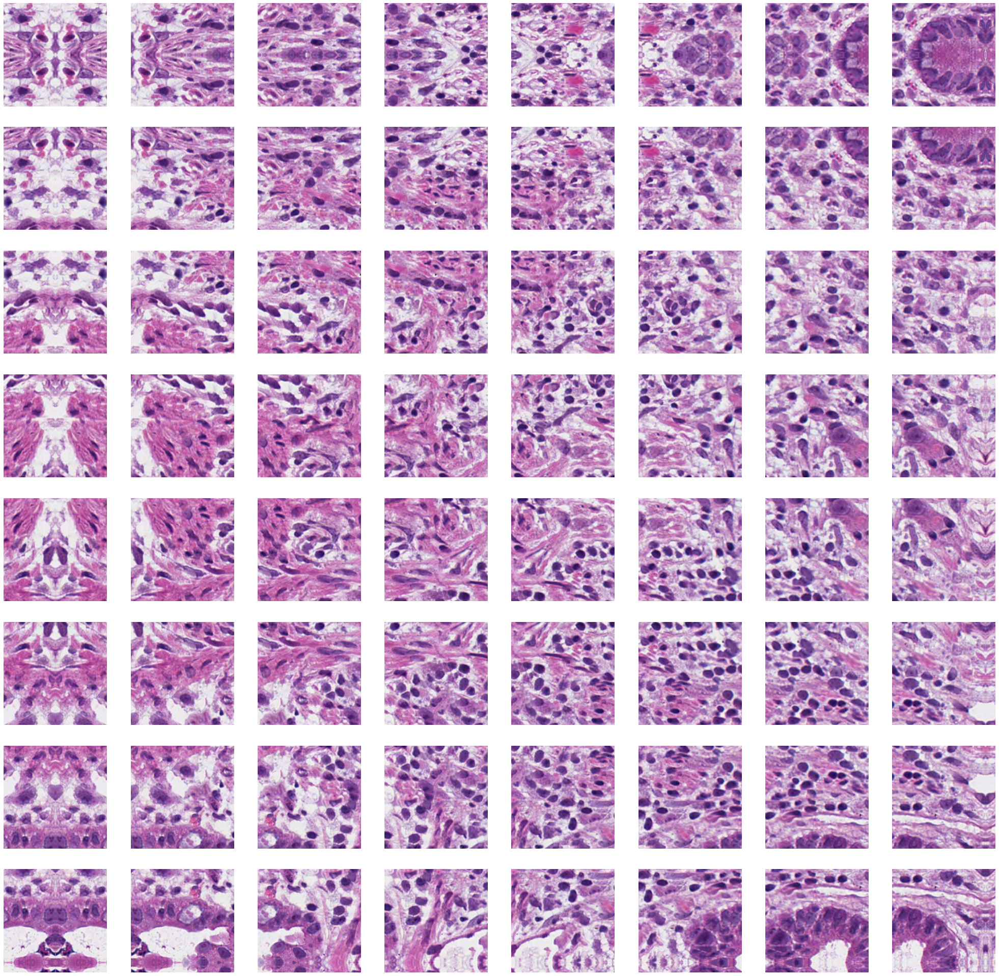

In [3]:
writer_kumar = DB_writer(conf, verbose=False)
writer_kumar.viz_patches_example(index=3, img_type="img", phase="test")

In [4]:
writer_kumar.write_dbs()

/home/leos/.local/lib/python3.6/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function extract_patches is deprecated; The function feature_extraction.image.extract_patches has been deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(msg, category=FutureWarning)


../utils/utils.py:238: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


array([  0,  86, 123, 136, 141, 147, 149, 157, 159, 161, 163, 187, 193,
       204, 206, 213, 215, 218, 227, 233, 238, 240, 244, 246, 266, 268,
       286, 301, 345, 356, 372, 373, 376, 379, 383, 389, 414, 431, 452,
       467, 476, 487, 511, 512, 525, 528, 529, 539, 545, 547, 553, 557,
       575, 602, 611, 620, 626, 636, 640, 641, 643, 647, 657, 668, 669,
       673, 674, 677, 708, 710, 721, 763], dtype=uint16)

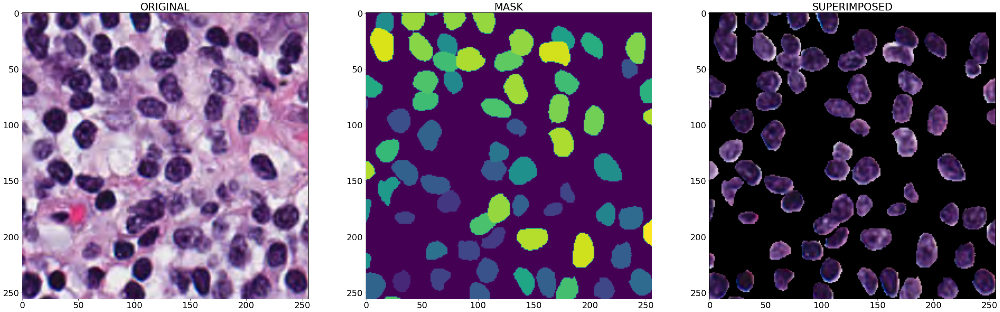

In [5]:
# Visualize masks and image patches for checking correctness
files = [file for file in writer_kumar.database_dir.iterdir()]
visualize_db_patches(files[2].as_posix(), index=100)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

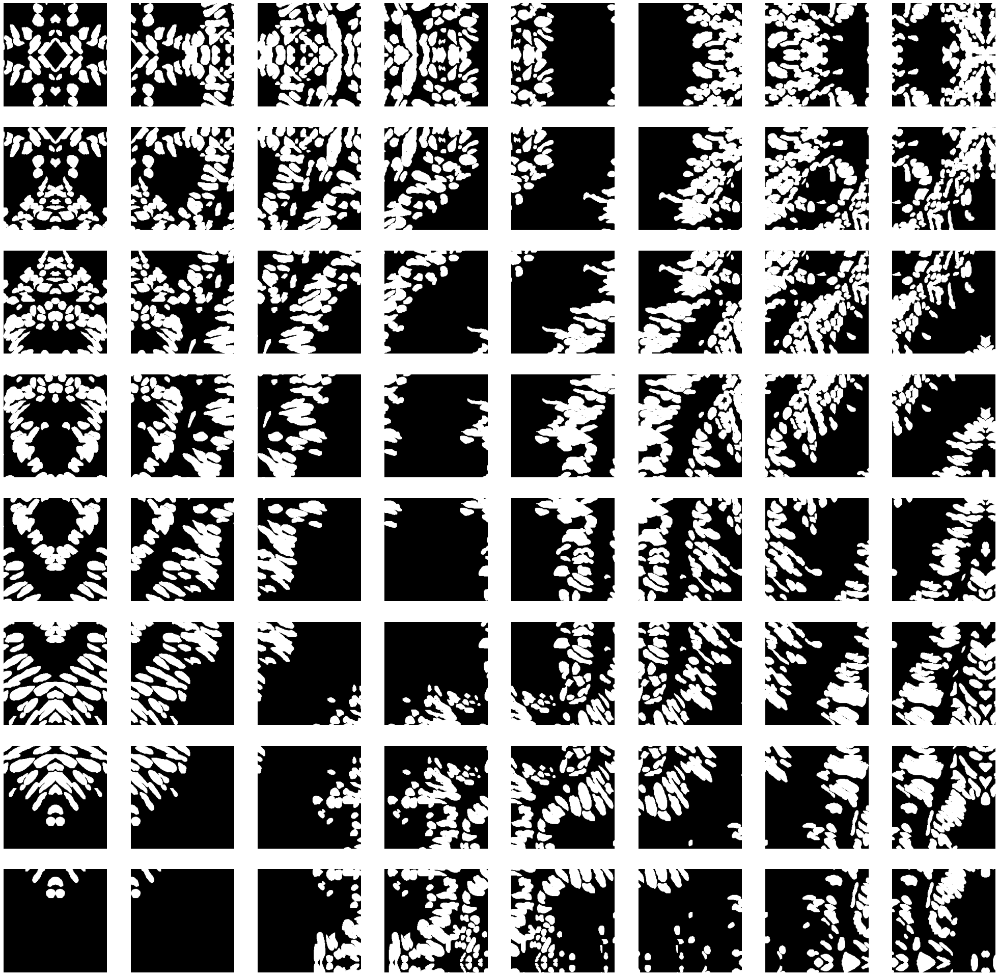

In [5]:
conf['dataset'] = 'consep'
writer_consep = DB_writer(conf, verbose=False)
writer_consep.viz_patches_example(index=3, img_type="mask", phase="train")

In [7]:
writer_consep.write_dbs()

array([  0,   1,   6,  11,  18,  19,  20,  22,  25,  26,  33,  37,  42,
        50,  51,  54,  62,  66,  67,  69,  70,  75,  77,  84,  97,  98,
       104, 105, 109, 120, 124, 129, 140, 147, 148, 169, 170, 171, 179,
       182, 188, 200, 203, 216, 225, 228, 247, 250, 255, 256, 270, 276,
       278, 288, 296, 320, 338, 341, 374, 379, 385, 390, 393, 412, 438,
       448, 470, 477, 504, 519, 542, 554, 598, 603, 644, 651, 702, 729,
       738, 751, 791, 797], dtype=uint16)

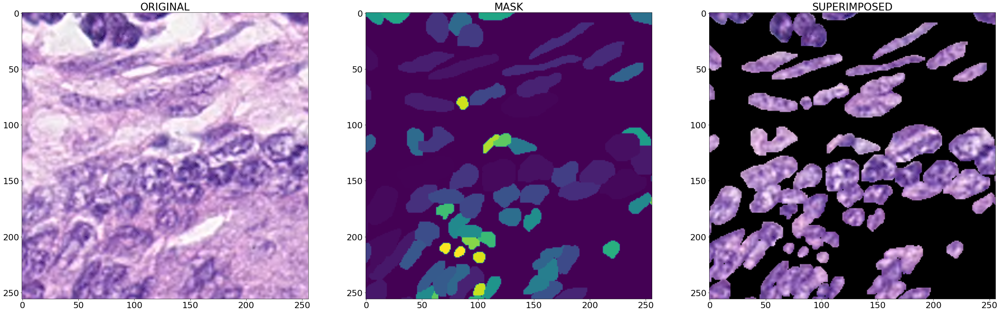

In [8]:
# Visualize masks and image patches for checking correctness
files = [file for file in writer_consep.database_dir.iterdir()]
visualize_db_patches(files[2].as_posix(), index=10)

In [9]:
conf['dataset'] = 'pannuke'
writer_pannuke = DB_writer(conf, verbose=False)

In [10]:
writer_pannuke.write_dbs()

array([  0, 121, 123, 134, 140, 143, 145, 146, 148, 153, 154, 163, 164,
       167, 170, 171, 174, 177, 186, 187, 189, 190, 193, 195, 197, 203,
       204, 207, 209, 214, 216, 218, 222, 224, 229, 230, 416],
      dtype=uint16)

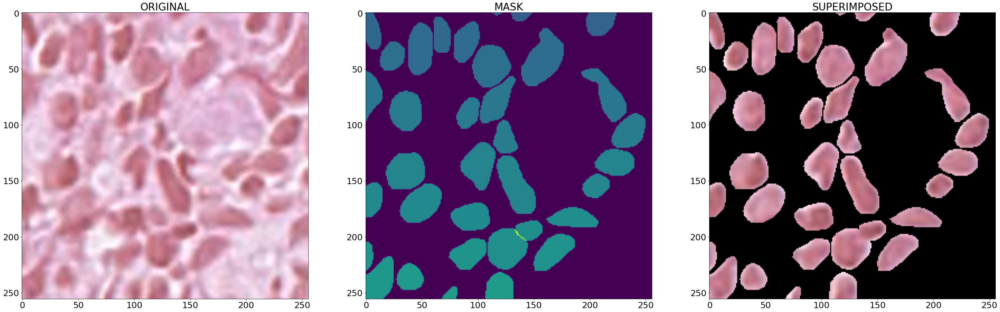

In [25]:
files = [file for file in writer_pannuke.database_dir.iterdir()]
visualize_db_patches(files[2].as_posix(), index=841)